# Node2Vec

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

from preprocessing.prepare_data import get_data

## Pre-processing

In [2]:
data = get_data()

migration_data = data.immigration
feature_data = data.df_features

data.merge_data()

merged_data = data.df_merged

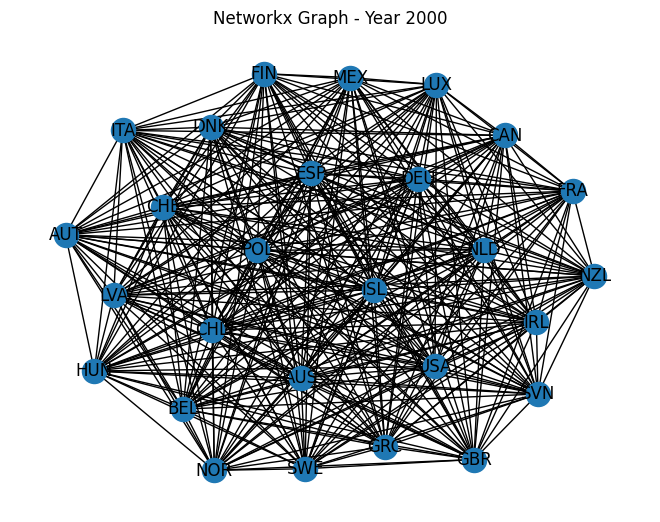

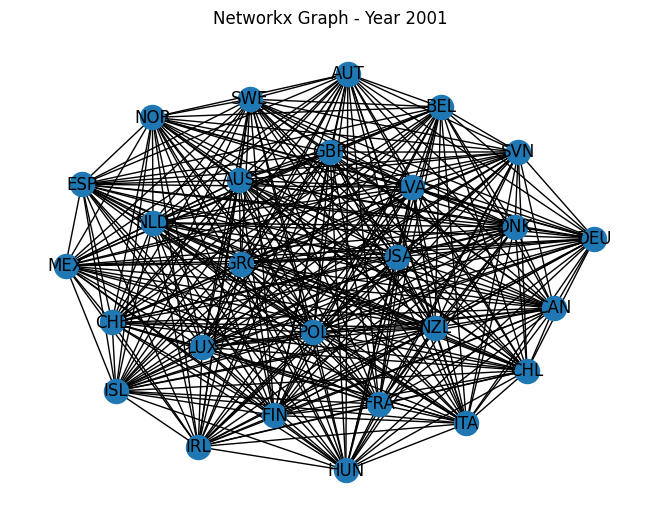

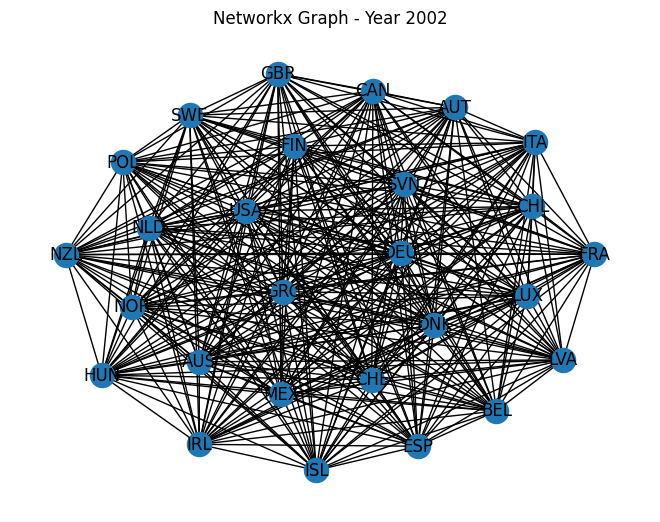

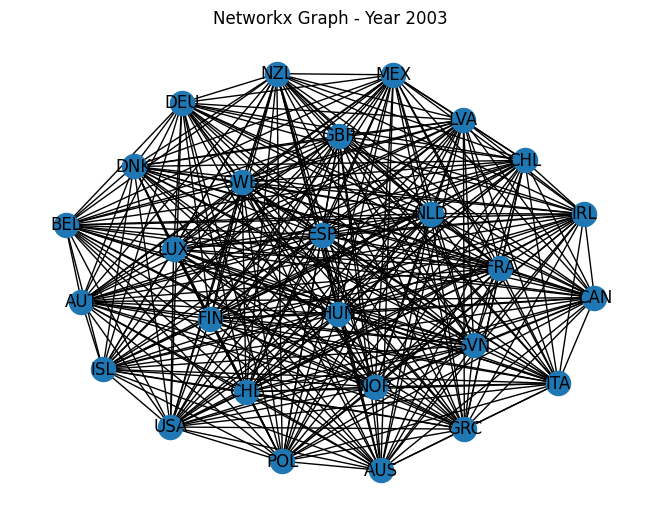

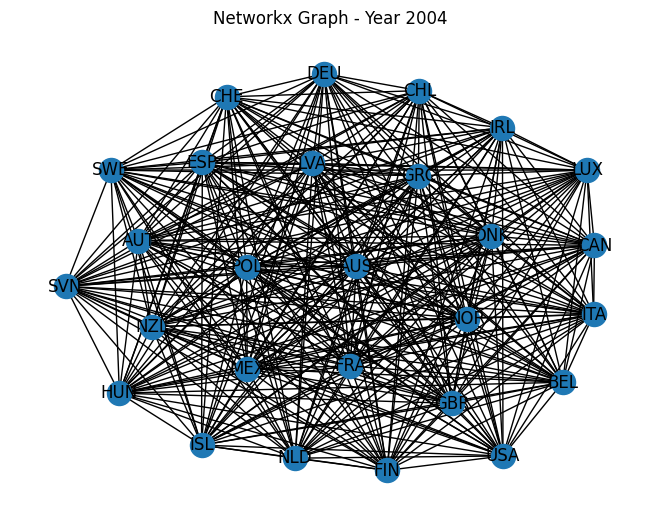

...

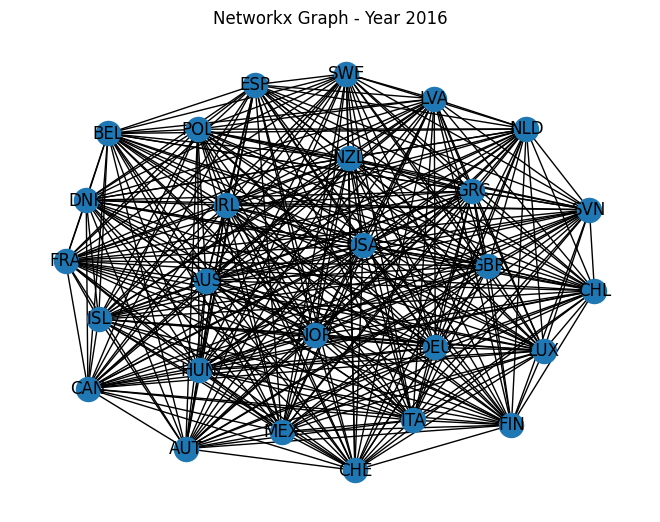

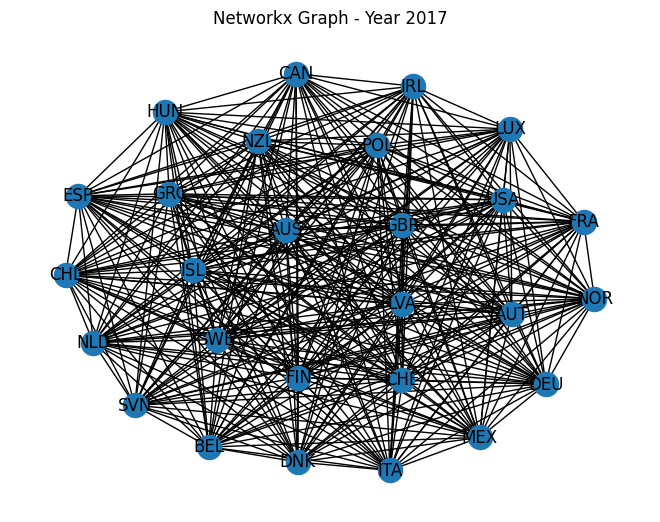

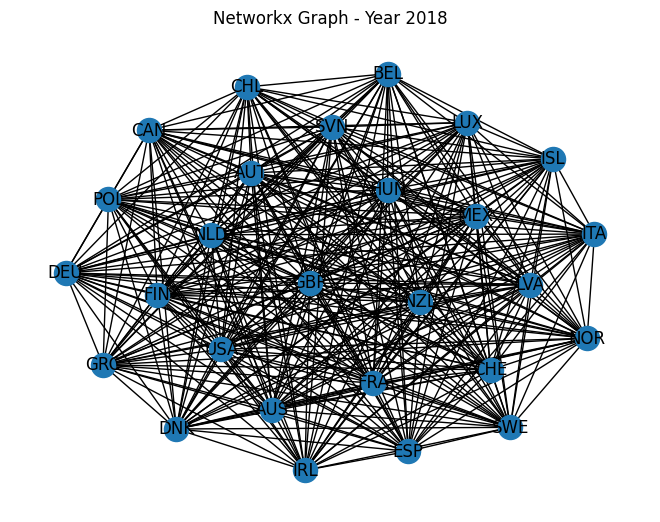

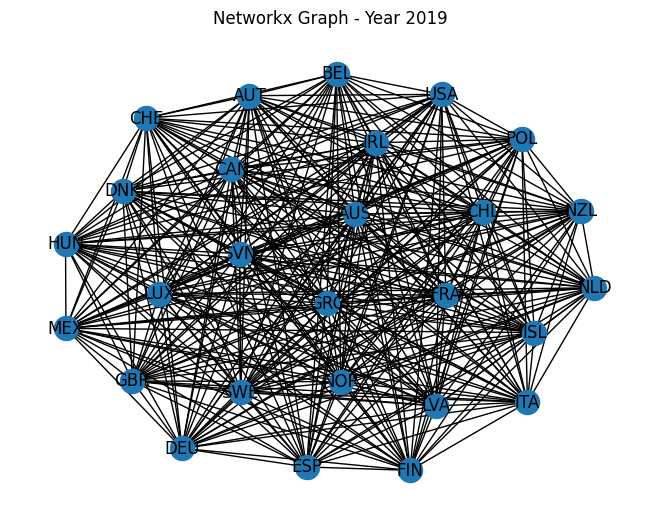

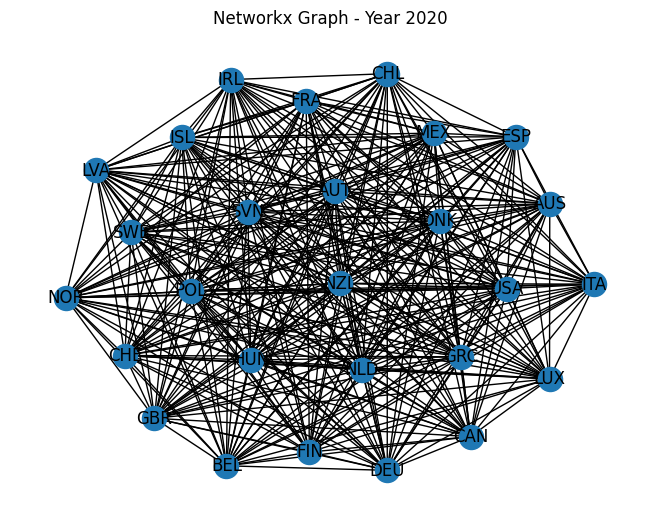

In [3]:
for year in migration_data['Year'].unique():
    # Filter the DataFrame for the current year
    year_df = migration_data[migration_data['Year'] == year]

    # Create a networkx graph
    G = nx.from_pandas_edgelist(year_df, 'CO2', 'COU', ['Value'])

    # Plot the graph
    plt.figure()
    nx.draw(G, with_labels=True)
    plt.title(f'Networkx Graph - Year {year}')
    plt.show()

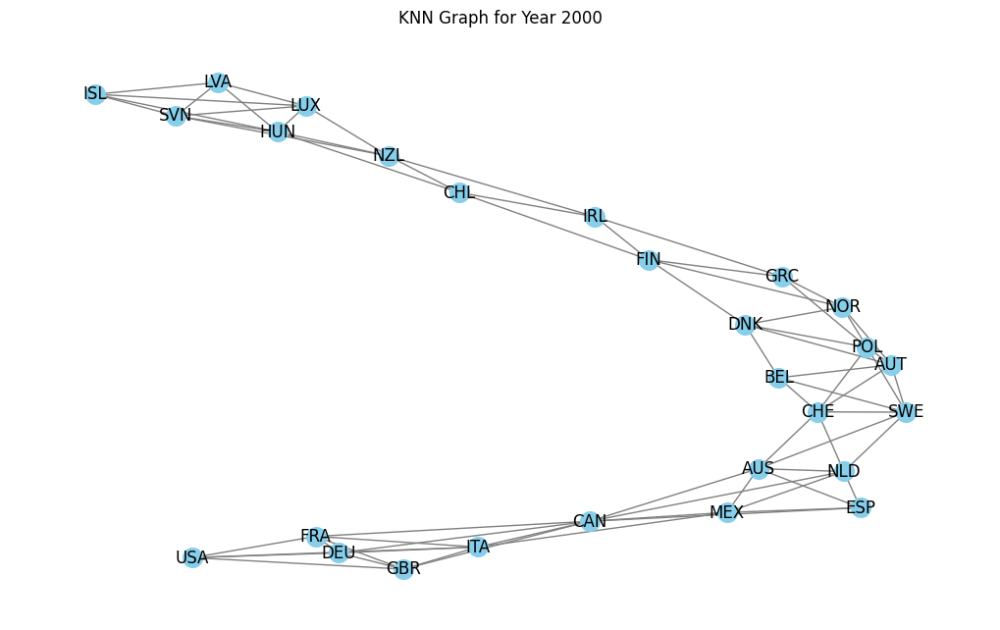

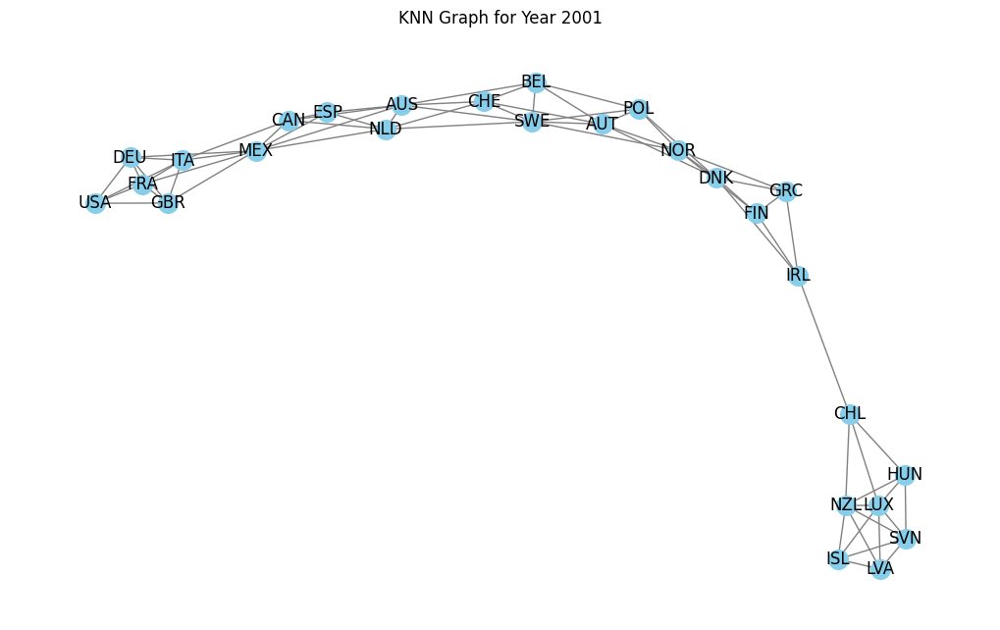

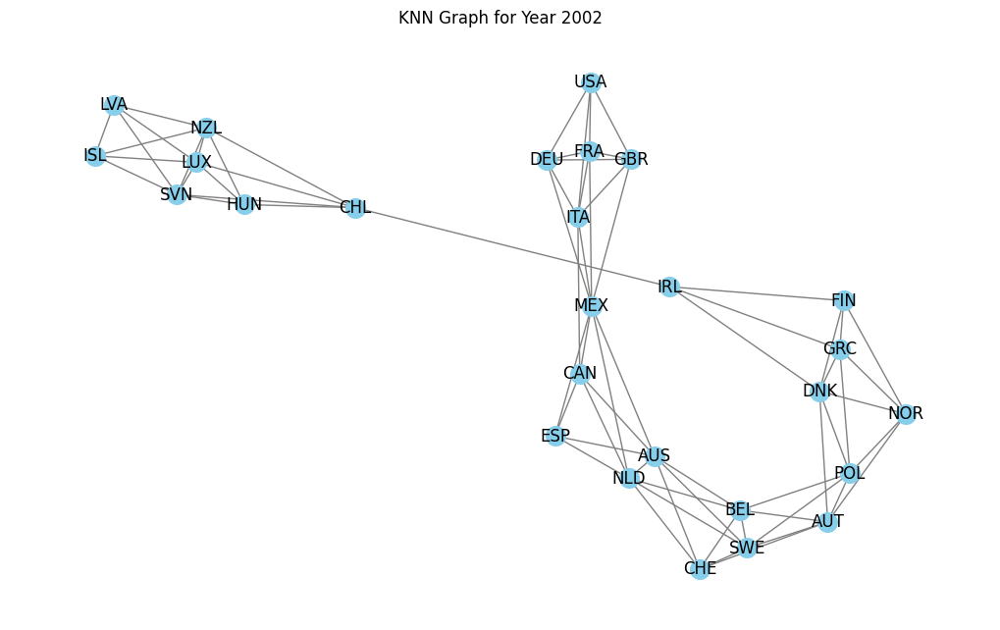

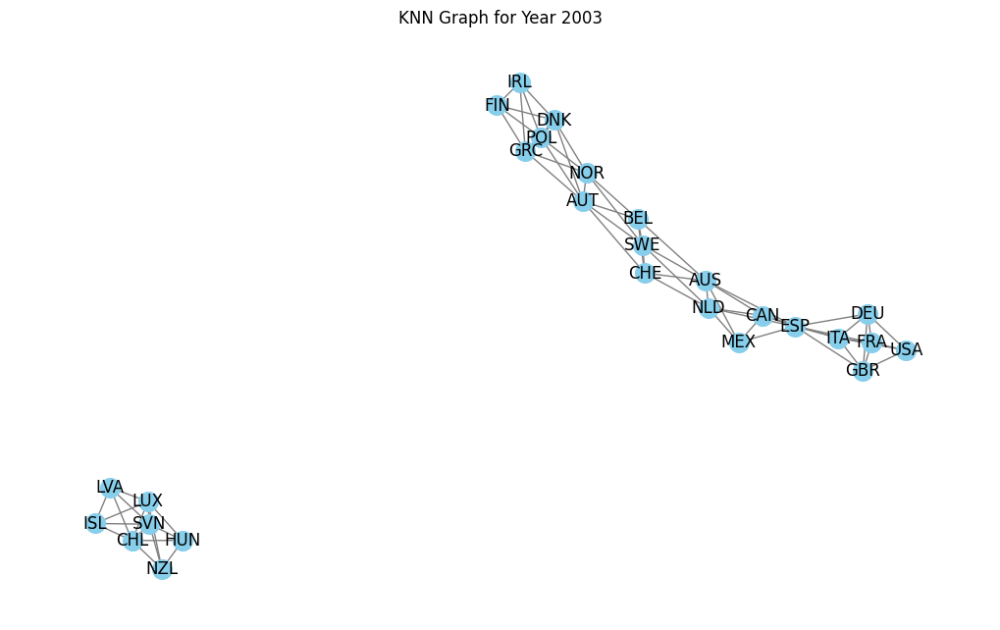

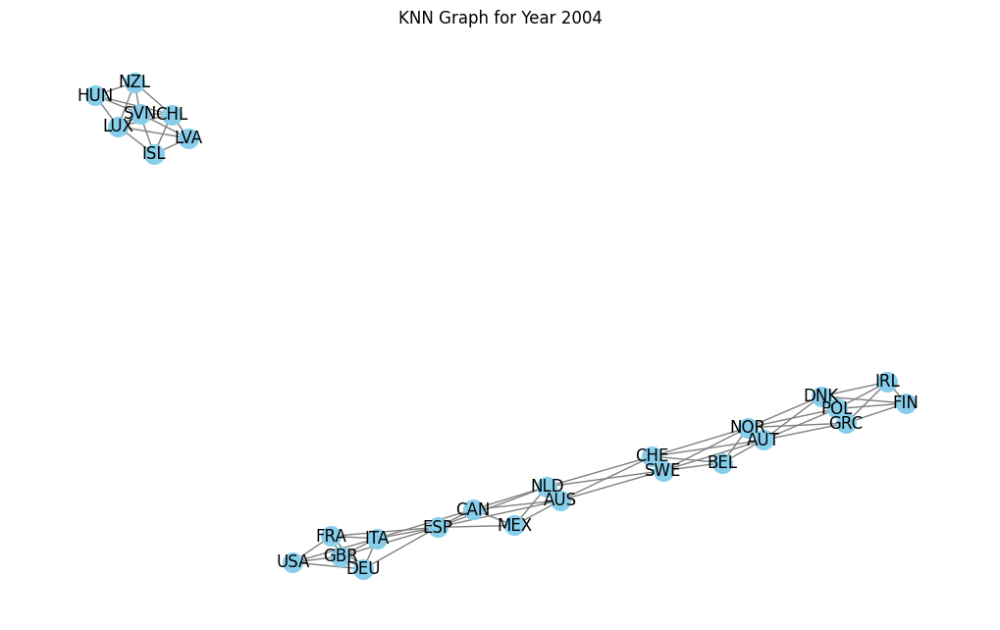

...

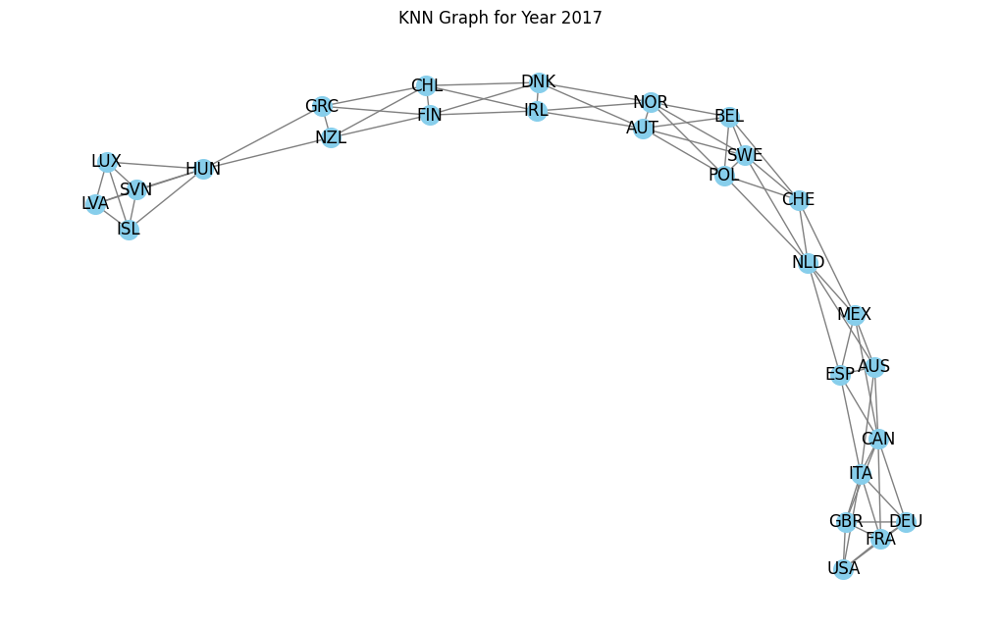

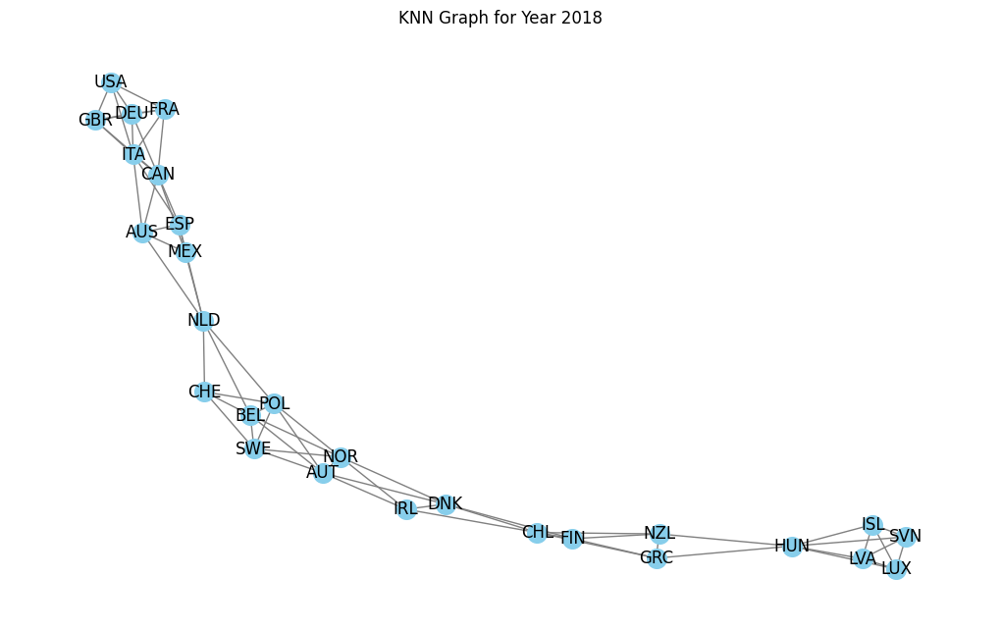

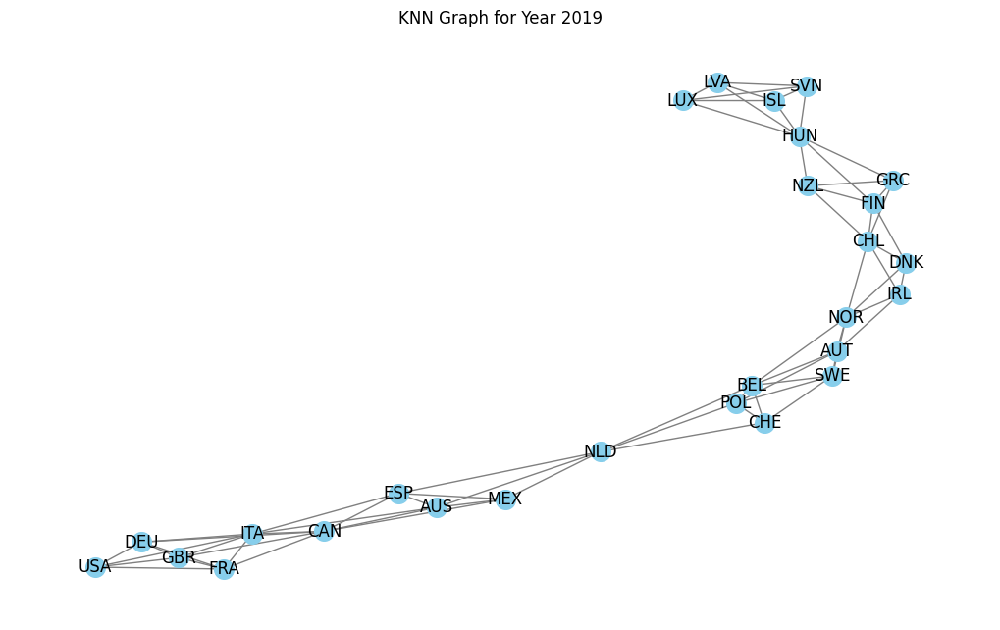

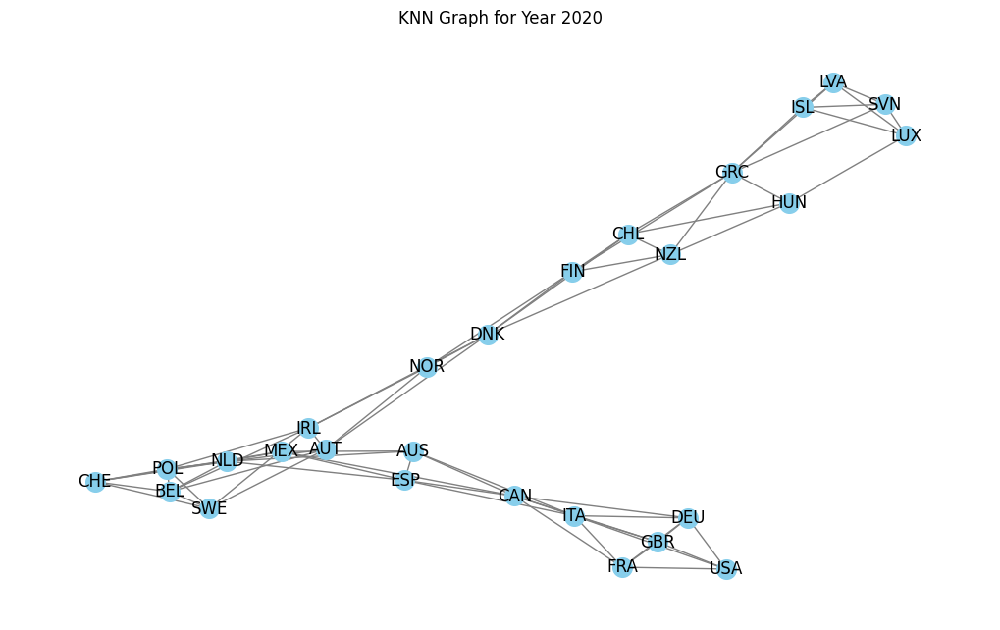

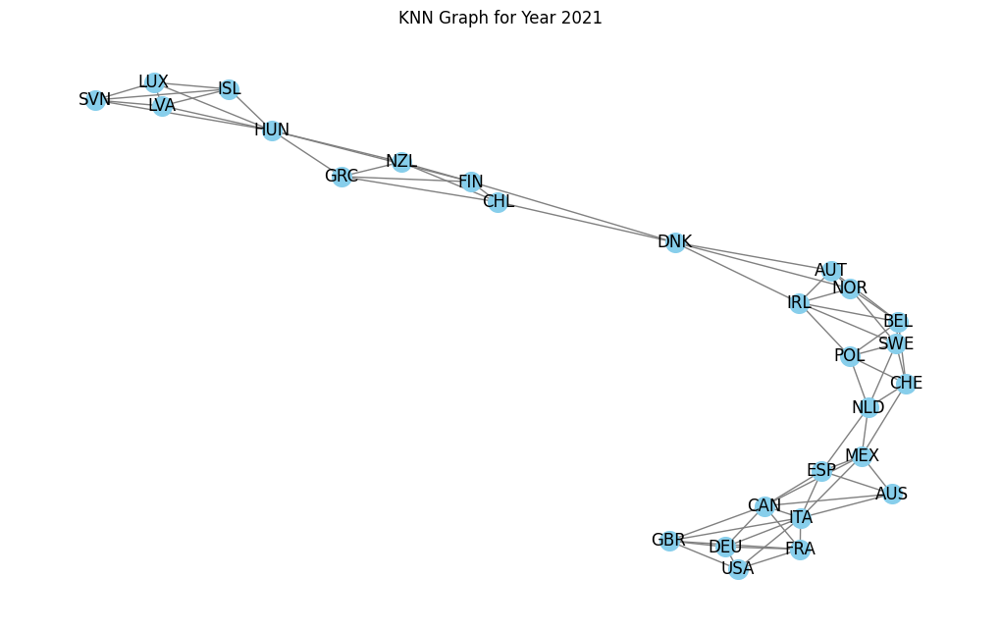

In [4]:
from sklearn.neighbors import kneighbors_graph
from sklearn.neighbors import NearestNeighbors

k = 5  # Number of nearest neighbors to consider

for year in feature_data['Year'].unique():
    # Filter the DataFrame for the current year
    year_df = feature_data[feature_data['Year'] == year]

    # Create a feature matrix for the current year
    features = year_df[['Country', 'Carbon Emissions', 'Education Expenditure', 'Foreign Direct Investment (FDI) Inflows',
                        'GDP', 'Health Expenditure', 'Inflation Rate', 'Internet Penetration',
                        'Life Expectancy', 'Renewable Energy Production', 'Unemployment Rate']].values

    # Fit the KNN model
    knn = NearestNeighbors(n_neighbors=k, metric='euclidean')
    knn.fit(features[:, 1:])

    # Find the k nearest neighbors for each point
    distances, indices = knn.kneighbors(features[:, 1:])

    # Create the KNN graph
    G = nx.Graph()

    # Add nodes with their attributes
    for i, country in enumerate(features[:, 0]):
        node_attributes = {feature_name: feature_value for feature_name, feature_value in zip(
            year_df.columns[3:], features[i, 1:])}
        G.add_node(country, **node_attributes)

    # Add edges between the k nearest neighbors
    for i in range(len(indices)):
        country = features[i, 0]
        for neighbor_index in indices[i]:
            neighbor_country = features[neighbor_index, 0]
            if(country != neighbor_country):
              G.add_edge(country, neighbor_country)

    # Plot the graph
    plt.figure(figsize=(10, 6))
    nx.draw(G, with_labels=True, node_size=200, node_color='skyblue', edge_color='gray')
    plt.title('KNN Graph for Year {}'.format(year))
    plt.show()

## Node2Vec Part

In [5]:
!pip install node2vec

In [6]:
import networkx as nx
from node2vec import Node2Vec

from sklearn.neighbors import kneighbors_graph
from sklearn.neighbors import NearestNeighbors

k = 5  # Number of nearest neighbors to consider

node2vec_features = {}

for year in feature_data['Year'].unique():
    # Create a feature matrix for the current year
    features = year_df[['Country', 'Carbon Emissions', 'Education Expenditure', 'Foreign Direct Investment (FDI) Inflows',
                        'GDP', 'Health Expenditure', 'Inflation Rate', 'Internet Penetration',
                        'Life Expectancy', 'Renewable Energy Production', 'Unemployment Rate']].values

    # Fit the KNN model
    knn = NearestNeighbors(n_neighbors=k, metric='euclidean')
    knn.fit(features[:, 1:])

    # Find the k nearest neighbors for each point
    distances, indices = knn.kneighbors(features[:, 1:])

    # Create the KNN graph
    G = nx.Graph()

    # Add nodes with their attributes
    for i, country in enumerate(features[:, 0]):
        node_attributes = {feature_name: feature_value for feature_name, feature_value in zip(
            year_df.columns[3:], features[i, 1:])}
        G.add_node(country, **node_attributes)

    # Add edges between the k nearest neighbors
    for i in range(len(indices)):
        country = features[i, 0]
        for neighbor_index in indices[i]:
            neighbor_country = features[neighbor_index, 0]
            if(country != neighbor_country):
              G.add_edge(country, neighbor_country)


    # Initialize node2vec
    node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=200, workers=4)

    # Generate walks
    walks = node2vec.walks

    # Train the model
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Get the embeddings for all nodes in the graph
    node_embeddings = {node: model.wv[node] for node in G.nodes}

    for country in feature_data['Country'].unique():
      node2vec_features[(country, year)] = node_embeddings[country]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/27 [00:00<?, ?it/s]

In [7]:
print(merged_data.columns)

Index(['Country_x', 'Year', 'Carbon Emissions_x', 'Education Expenditure_x',
       'Foreign Direct Investment (FDI) Inflows_x', 'GDP_x',
       'Health Expenditure_x', 'Inflation Rate_x', 'Internet Penetration_x',
       'Life Expectancy_x', 'Renewable Energy Production_x',
       'Unemployment Rate_x', 'Country_y', 'Carbon Emissions_y',
       'Education Expenditure_y', 'Foreign Direct Investment (FDI) Inflows_y',
       'GDP_y', 'Health Expenditure_y', 'Inflation Rate_y',
       'Internet Penetration_y', 'Life Expectancy_y',
       'Renewable Energy Production_y', 'Unemployment Rate_y', 'CO2', 'COU',
       'Value'],
      dtype='object')


In [8]:
node2vec_X = []
node2vec_y = []

for index, row in merged_data.iterrows():
    country1 = row['Country_x']
    country2 = row['Country_y']
    year = row['Year']
    value = row['Value']

    node2vec_X.append(list(node2vec_features[(country1, year)])+list(node2vec_features[(country2, year)]))
    node2vec_y.append(value)

# Calculate the percentiles for splitting
percentiles = [0, 33.33, 66.66, 100]

# Split the values into three buckets based on percentiles
buckets = np.percentile(node2vec_y, percentiles)

# Perform binning to split the values into classes
node2vec_y = pd.cut(node2vec_y, bins=buckets, labels=False, include_lowest=True)

node2vec_X = np.array(node2vec_X)
node2vec_y = np.array(node2vec_y)

node2vec_X.shape, node2vec_y.shape

((14742, 128), (14742,))

In [9]:
X_train, X_test, y_train, y_test = train_test_split(node2vec_X, node2vec_y, test_size=0.3)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((10319, 128), (4423, 128), (10319,), (4423,))

## Node2Vec XGBoost

In [10]:
import xgboost as xgb
from sklearn.metrics import classification_report

# Train the XGBoost classifier
clf = xgb.XGBClassifier()
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate evaluation metrics
classification_metrics = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_metrics)

Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.79      0.76      1604
           1       0.55      0.52      0.53      1388
           2       0.78      0.76      0.77      1431

    accuracy                           0.70      4423
   macro avg       0.69      0.69      0.69      4423
weighted avg       0.69      0.70      0.69      4423



## Node2Vec RandomForest

In [11]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train the Random Forest classifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate evaluation metrics
classification_metrics = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_metrics)

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.79      0.76      1604
           1       0.54      0.48      0.51      1388
           2       0.75      0.76      0.76      1431

    accuracy                           0.69      4423
   macro avg       0.68      0.68      0.68      4423
weighted avg       0.68      0.69      0.68      4423

